In [55]:
import datetime
import jenkspy
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.text
import numpy as np
import pandas as pd
import sklearn
import sklearn.cluster as skcluster
import seaborn as sns

sns.set_style("darkgrid")
%matplotlib inline

# Import our data

In [2]:
%%time

# Exported using Xiaomi Mi Band Tools
%time df = pd.read_csv("data/Export-2021-01-21-18-37-56.csv")
%time df.dateTime = pd.to_datetime(df.dateTime, format=r"%d.%m.%Y %H:%M:%S")
%time df.rateZone = df.rateZone.str.rstrip("%").astype("float") / 100

df = df.set_index("dateTime").sort_index()

CPU times: user 2.99 s, sys: 445 ms, total: 3.43 s
Wall time: 3.42 s
CPU times: user 12.2 s, sys: 54.6 ms, total: 12.2 s
Wall time: 12.1 s
CPU times: user 1.57 s, sys: 119 ms, total: 1.69 s
Wall time: 1.69 s
CPU times: user 17 s, sys: 649 ms, total: 17.7 s
Wall time: 17.6 s


In [3]:
%%time

@np.vectorize
def floor_day(datetime: datetime.date):
    return datetime.replace(day=1)

@np.vectorize
def elapsed_seconds(time: datetime.time):
    return time.hour * 60**2 + time.minute * 60 + time.second

intervalled = df.copy()
%time intervalled["month"] = floor_day(df.index.date).astype(np.datetime64)
%time intervalled["seconds"] = elapsed_seconds(df.index.time)
intervalled["hour"] = df.index.hour
intervalled["weekday"] = df.index.day_name().astype(str)

CPU times: user 10.2 s, sys: 220 ms, total: 10.4 s
Wall time: 10.4 s
CPU times: user 2.74 s, sys: 170 ms, total: 2.91 s
Wall time: 2.89 s
CPU times: user 15 s, sys: 631 ms, total: 15.7 s
Wall time: 15.6 s


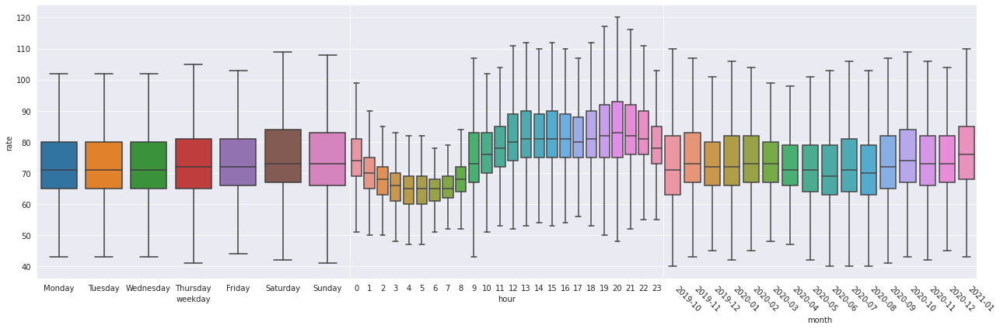

In [4]:
fig: plt.Figure
fig, (ax0, ax1, ax2) = plt.subplots(
    figsize=(18,6),
    gridspec_kw={"wspace": 0},
    ncols=3, 
    sharey=True)

sns.boxplot(
    ax=ax0,
    data=intervalled,
    order=["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
    showfliers=False,
    x="weekday",
    y="rate",
)

sns.boxplot(
    ax=ax1,
    data=intervalled,
    showfliers=False,
    x="hour",
    y="rate"
)

sns.boxplot(
    ax=ax2,
    data=intervalled,
    showfliers=False,
    x="month",
    y="rate"
)

ax1.yaxis.label.set_visible(False)
ax2.yaxis.label.set_visible(False)

def fmt(label: matplotlib.text.Text):
    label.set_text(label.get_text()[:7])
    label.set_rotation(315)
    label.set_horizontalalignment("left")
    return label

ax2.set_xticklabels(
    labels=map(
        fmt, 
        ax2.get_xticklabels()
    )
)

fig.tight_layout()
fig.show()

In [5]:
work = df[
    (df.index.hour >= 10)      # After 10 AM
    & (df.index.hour <= 18)    # Before 6 PM
    & (df.index.weekday >= 0 ) # After Monday
    & (df.index.weekday <= 4)  # Before Saturday
    ]

In [6]:
df2 = df.copy()
df2 = df2.drop(columns="rateZone")
df2["date"] = df2.index.date
df2["time"] = df2.index.floor("10min").time
df2 = df2.set_index("date")
table = df2.groupby(["date", "time"]).mean().unstack(level=0)

CPU times: user 1.45 s, sys: 151 ms, total: 1.6 s
Wall time: 1.33 s


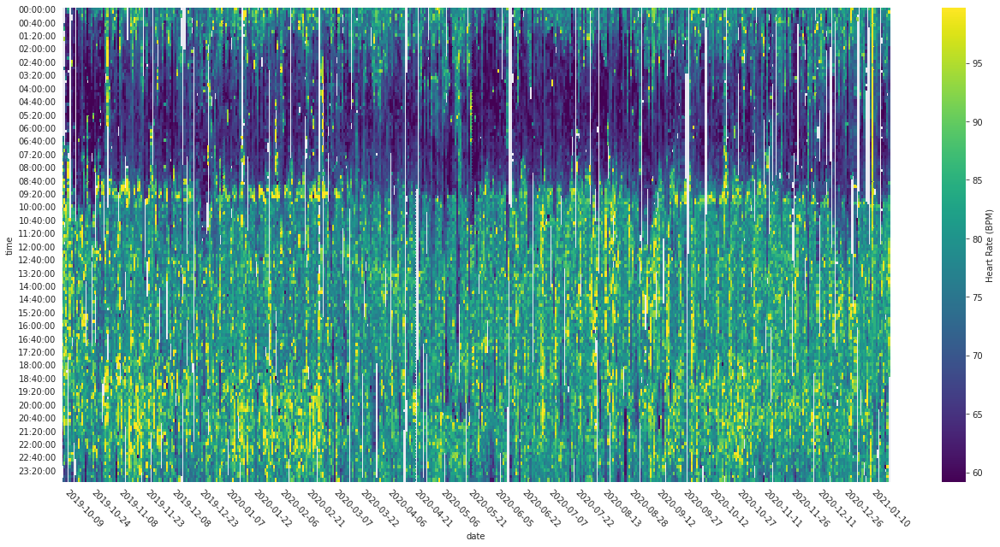

In [7]:
%%time

fig: plt.Figure
ax:  plt.Axes
fig, ax = plt.subplots(figsize=(18,9))

sns.heatmap(
    table,
    ax=ax, 
    cbar_kws={
        "label": "Heart Rate (BPM)",
        },
    cmap="viridis",
    robust=True,
    xticklabels=15,
)

def fmt(label: matplotlib.text.Text):
    label.set_text(label.get_text()[5:])
    label.set_rotation(315)
    label.set_horizontalalignment("left")
    return label

ax.set_xticklabels(
    labels=map(
        fmt, 
        ax.get_xticklabels()
    )
)

ax.set_xlabel("date")

fig.tight_layout()
fig.show()

CPU times: user 24.5 s, sys: 1.88 s, total: 26.4 s
Wall time: 23.6 s


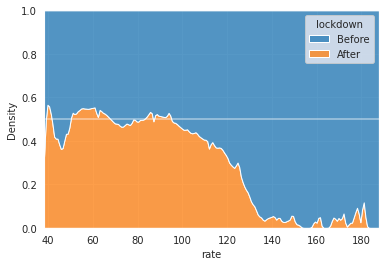

In [8]:
%%time

periods = df.copy()
periods["lockdown"] = "Before"
periods.lockdown[
    pd.datetime(year=2020, month=3, day=23)
    :#pd.datetime(year=2020, month=7, day=13)
    ] = "After"

fig: plt.Figure
ax:  plt.Axes
fig, ax = plt.subplots()

sns.kdeplot(
    ax=ax,
    common_norm=False,
    data=periods,
    hue="lockdown",
    multiple="fill",
    x="rate",
)

ax.axhline(alpha=0.5, color="white", y=0.5)

fig.show()

CPU times: user 6.36 s, sys: 97.7 ms, total: 6.45 s
Wall time: 6.42 s


<AxesSubplot:xlabel='dateTime', ylabel='rate'>

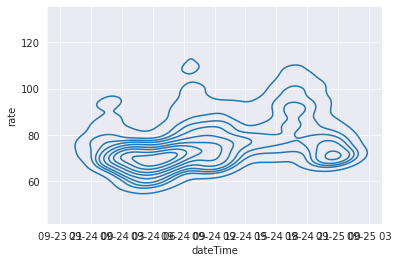

In [34]:
%%time
slice = df[df.index.date == datetime.date(2020,9,24)]
sns.kdeplot(
    x=slice.index,
    y=slice.rate,
)

CPU times: user 6.01 s, sys: 452 ms, total: 6.46 s
Wall time: 1.42 s


<AxesSubplot:xlabel='dateTime', ylabel='rate'>

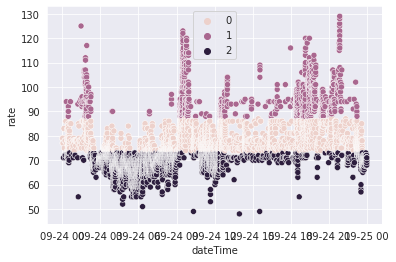

In [54]:
%%time

kmeans = skcluster.KMeans(n_clusters=3)

kmeans.fit(slice.rate.values.reshape(-1,1))

sns.scatterplot(
    hue=kmeans.predict(slice.rate.values.reshape(-1,1)),
    x=slice.index, 
    y=slice.rate,
)

<AxesSubplot:xlabel='dateTime', ylabel='rate'>

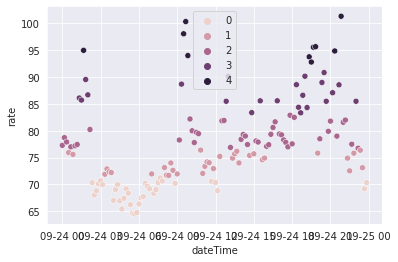

In [65]:
slice = slice.resample("10min").mean()

jnb = jenkspy.JenksNaturalBreaks(nb_class=5)
jnb.fit(slice.rate)

sns.scatterplot(
    hue=jnb.predict(slice.rate),
    x=slice.index,
    y=slice.rate,
)



array([0, 0, 0, ..., 0, 0, 0])